# CLIP-GLaSS

Wellcome to the Google's Colab demo of CLIP-GLaSS.

For faster results we encourage you to use your own GPU.


## Instructions

1) Click the play button of the first block titled "CLIP-GLaSS initialization" and wait for it to finish the initialization

2) Select a config and a target from the form titled "CLIP-GLaSS settings"

3) Click the play button of the block titled "CLIP-GLaSS settings"

In [1]:
#Clone Repo and Change Working Directory
!git clone https://github.com/kk-digital/clip-glass
%cd clip-glass/

Cloning into 'clip-glass'...
remote: Enumerating objects: 115, done.
remote: Counting objects: 100% (50/50), done.
remote: Compressing objects: 100% (39/39), done.
remote: Total 115 (delta 21), reused 23 (delta 11), pack-reused 65
Receiving objects: 100% (115/115), 40.20 MiB | 28.29 MiB/s, done.
Resolving deltas: 100% (32/32), done.
/content/clip-glass


In [8]:
#Check Environment And Cuda Version 
from utility.CheckCuda import GetCuda
from utility.EnvChecker import GetEnvironment

GetCuda()
GetEnvironment()



CUDA version: 11.6


'colab'

In [ ]:
#@title CLIP-GLaSS initialization
import subprocess
import re

nvcc = subprocess.check_output(["nvcc", "--version"]).decode("utf-8")
version = re.findall("release (\d+\.\d+)", nvcc)[0]

pytorch_suffix = {
    "10.0": "+cu100",
    "10.1": "+cu101",
    "10.2": "",
}

pytorch_version = "1.7.1" + (pytorch_suffix[version] if version in pytorch_suffix else "+cu110")
torchvision_version = "0.8.2" + (pytorch_suffix[version] if version in pytorch_suffix else "+cu110")


try:
  import torch
except:
  !pip install torch=={pytorch_version} -f https://download.pytorch.org/whl/torch_stable.html

try:
  import torchvision
except:
  !pip install torchvision=={torchvision_version} -f https://download.pytorch.org/whl/torch_stable.html

In [ ]:
!pip3 install -r requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.8/127.8 KB 3.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 130.3/130.3 KB 9.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.2/7.2 MB 65.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 147.5/147.5 KB 7.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 KB 17.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 239.1/239.1 KB 26.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.1/64.1 KB 7.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 829.2/829.2 KB 58.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.7/114.7 KB 14.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.1/4.

100%|██████████████████████| 353976522/353976522 [00:01<00:00, 209471434.82it/s]
/usr/local/lib/python3.9/dist-packages/torchvision/transforms/transforms.py:329: UserWarning: Argument 'interpolation' of type int is deprecated since 0.13 and will be removed in 0.15. Please use InterpolationMode enum.
  warnings.warn(
100%|██████████| 715/715 [00:00<00:00, 261526.76B/s]


n_gen |  n_eval |   cv (min)   |   cv (avg)   |     fopt     |     favg    
    1 |      64 |  0.00000E+00 |  0.00000E+00 |      -0.2412 |      -0.1936
    2 |     128 |  0.00000E+00 |  0.00000E+00 |      -0.2554 |      -0.2119
    3 |     192 |  0.00000E+00 |  0.00000E+00 |      -0.2798 |      -0.2234
    4 |     256 |  0.00000E+00 |  0.00000E+00 |      -0.2798 |      -0.2333
    5 |     320 |  0.00000E+00 |  0.00000E+00 |      -0.2964 |       -0.242
    6 |     384 |  0.00000E+00 |  0.00000E+00 |      -0.2964 |      -0.2468
    7 |     448 |  0.00000E+00 |  0.00000E+00 |      -0.2964 |      -0.2524
    8 |     512 |  0.00000E+00 |  0.00000E+00 |      -0.3123 |      -0.2585
    9 |     576 |  0.00000E+00 |  0.00000E+00 |      -0.3123 |      -0.2632
   10 |     640 |  0.00000E+00 |  0.00000E+00 |      -0.3123 |      -0.2659


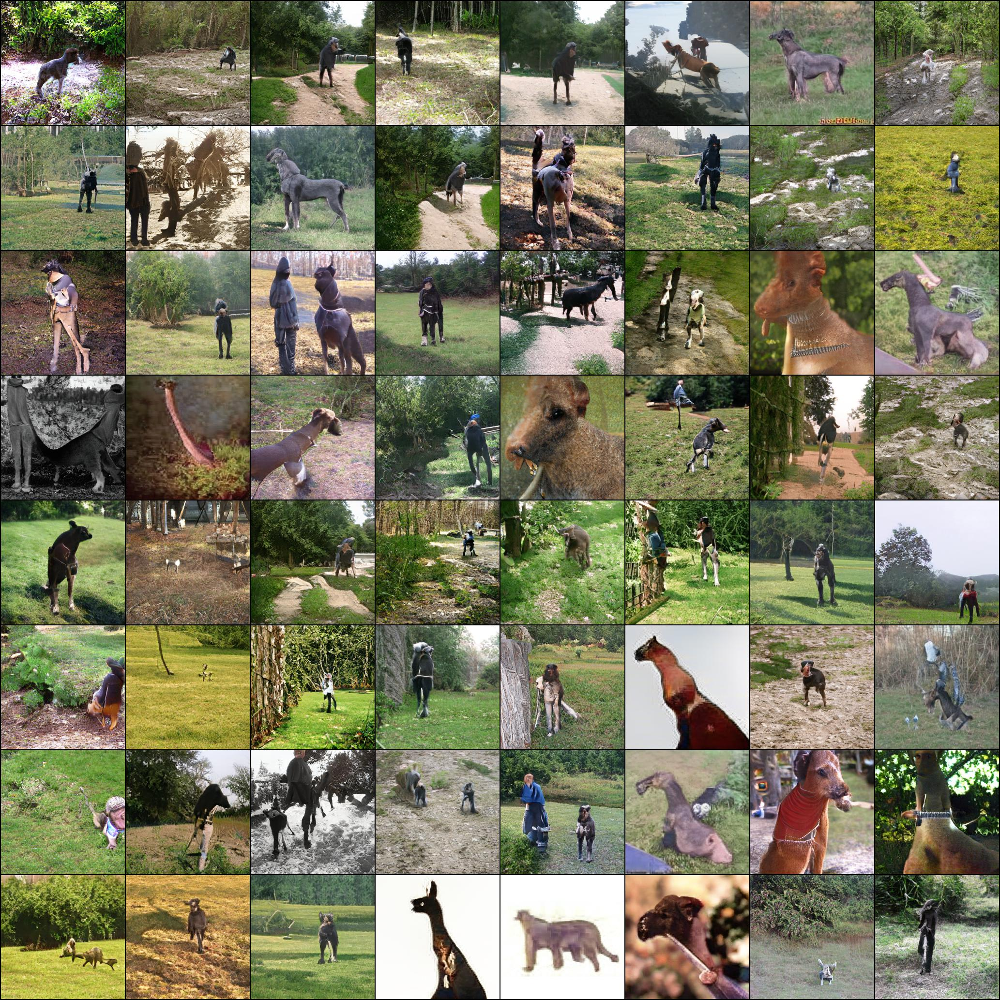

   11 |     704 |  0.00000E+00 |  0.00000E+00 |      -0.3123 |      -0.2686
   12 |     768 |  0.00000E+00 |  0.00000E+00 |      -0.3123 |      -0.2722
   13 |     832 |  0.00000E+00 |  0.00000E+00 |      -0.3123 |       -0.274
   14 |     896 |  0.00000E+00 |  0.00000E+00 |      -0.3123 |      -0.2769
   15 |     960 |  0.00000E+00 |  0.00000E+00 |      -0.3123 |      -0.2788
   16 |    1024 |  0.00000E+00 |  0.00000E+00 |      -0.3123 |      -0.2803
   17 |    1088 |  0.00000E+00 |  0.00000E+00 |      -0.3123 |      -0.2817
   18 |    1152 |  0.00000E+00 |  0.00000E+00 |      -0.3123 |      -0.2844
   19 |    1216 |  0.00000E+00 |  0.00000E+00 |      -0.3123 |      -0.2861
   20 |    1280 |  0.00000E+00 |  0.00000E+00 |      -0.3123 |      -0.2876


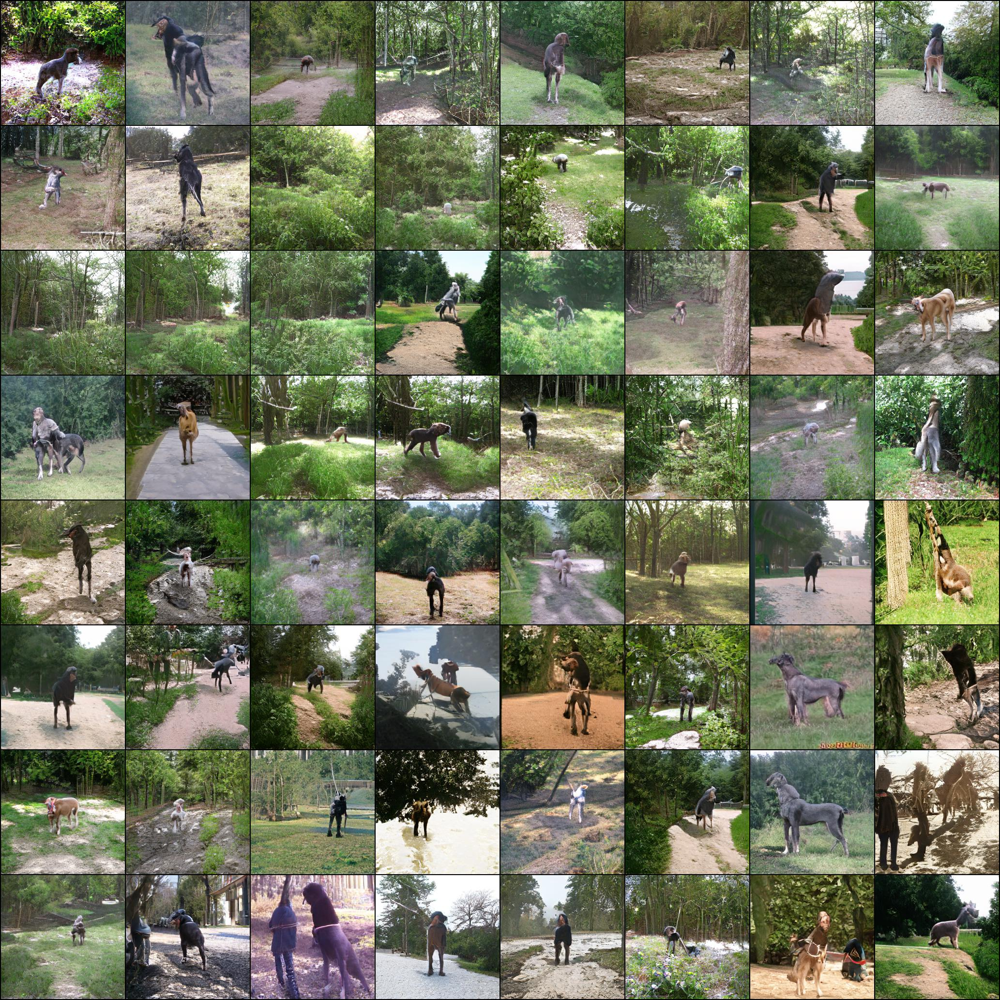

   21 |    1344 |  0.00000E+00 |  0.00000E+00 |      -0.3123 |      -0.2898
   22 |    1408 |  0.00000E+00 |  0.00000E+00 |      -0.3123 |       -0.291
   23 |    1472 |  0.00000E+00 |  0.00000E+00 |      -0.3242 |       -0.294
   24 |    1536 |  0.00000E+00 |  0.00000E+00 |      -0.3242 |       -0.295
   25 |    1600 |  0.00000E+00 |  0.00000E+00 |      -0.3242 |       -0.296
   26 |    1664 |  0.00000E+00 |  0.00000E+00 |      -0.3289 |      -0.2983
   27 |    1728 |  0.00000E+00 |  0.00000E+00 |      -0.3289 |      -0.2993
   28 |    1792 |  0.00000E+00 |  0.00000E+00 |      -0.3296 |      -0.3003
   29 |    1856 |  0.00000E+00 |  0.00000E+00 |      -0.3296 |      -0.3018
   30 |    1920 |  0.00000E+00 |  0.00000E+00 |      -0.3296 |      -0.3022


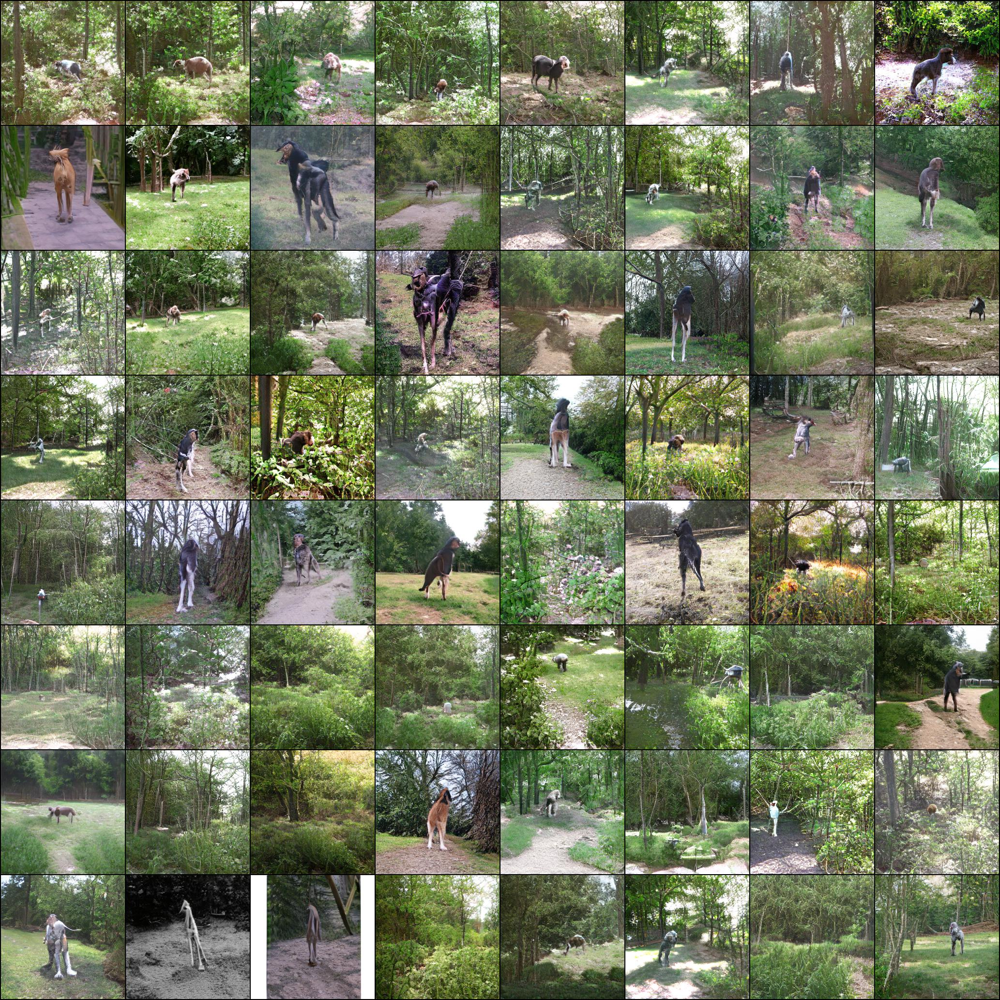

   31 |    1984 |  0.00000E+00 |  0.00000E+00 |      -0.3296 |      -0.3027
   32 |    2048 |  0.00000E+00 |  0.00000E+00 |      -0.3296 |      -0.3037
   33 |    2112 |  0.00000E+00 |  0.00000E+00 |      -0.3296 |       -0.305
   34 |    2176 |  0.00000E+00 |  0.00000E+00 |      -0.3345 |      -0.3066
   35 |    2240 |  0.00000E+00 |  0.00000E+00 |      -0.3345 |      -0.3066
   36 |    2304 |  0.00000E+00 |  0.00000E+00 |      -0.3345 |      -0.3066
   37 |    2368 |  0.00000E+00 |  0.00000E+00 |      -0.3345 |      -0.3071
   38 |    2432 |  0.00000E+00 |  0.00000E+00 |      -0.3345 |      -0.3079
   39 |    2496 |  0.00000E+00 |  0.00000E+00 |      -0.3345 |      -0.3079
   40 |    2560 |  0.00000E+00 |  0.00000E+00 |      -0.3345 |       -0.308


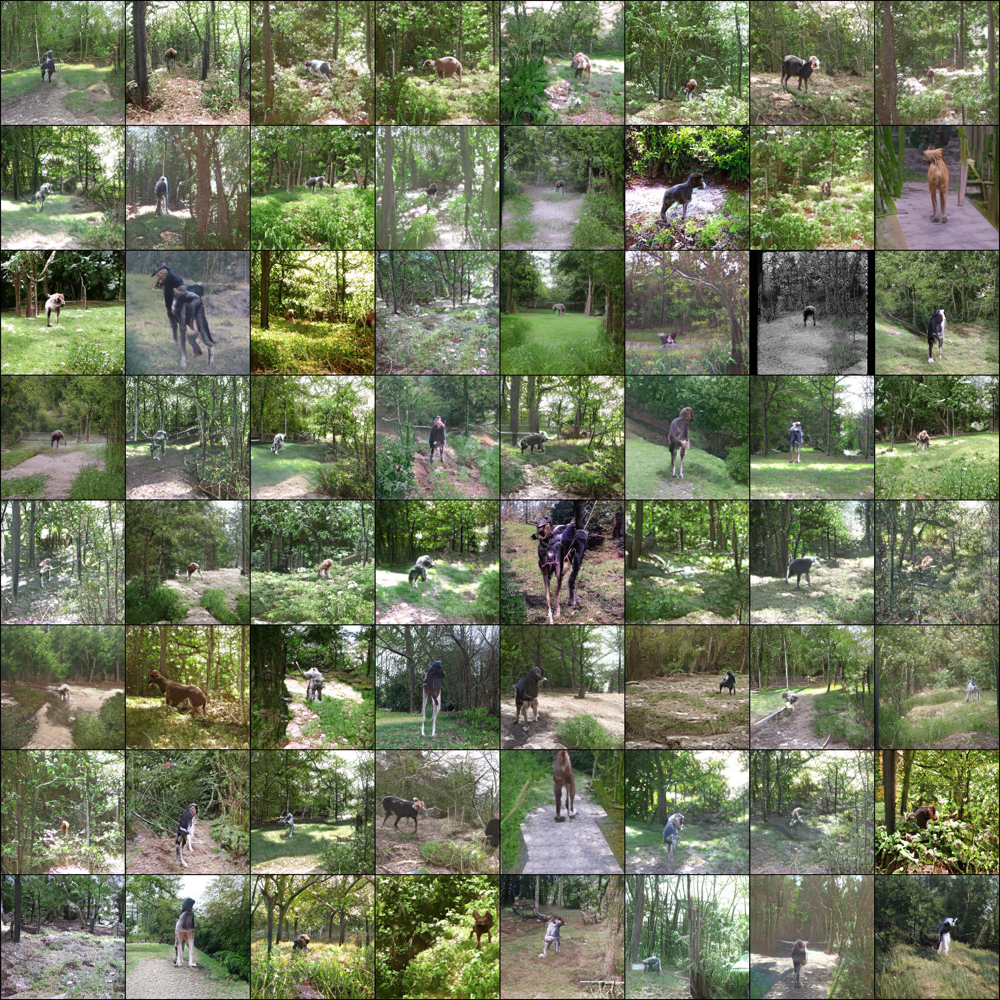

   41 |    2624 |  0.00000E+00 |  0.00000E+00 |      -0.3345 |       -0.309
   42 |    2688 |  0.00000E+00 |  0.00000E+00 |      -0.3345 |      -0.3096
   43 |    2752 |  0.00000E+00 |  0.00000E+00 |      -0.3345 |        -0.31
   44 |    2816 |  0.00000E+00 |  0.00000E+00 |      -0.3345 |      -0.3113
   45 |    2880 |  0.00000E+00 |  0.00000E+00 |      -0.3345 |      -0.3113
   46 |    2944 |  0.00000E+00 |  0.00000E+00 |      -0.3345 |       -0.312
   47 |    3008 |  0.00000E+00 |  0.00000E+00 |      -0.3345 |      -0.3123
   48 |    3072 |  0.00000E+00 |  0.00000E+00 |      -0.3345 |      -0.3123
   49 |    3136 |  0.00000E+00 |  0.00000E+00 |      -0.3354 |      -0.3132
   50 |    3200 |  0.00000E+00 |  0.00000E+00 |      -0.3354 |      -0.3137


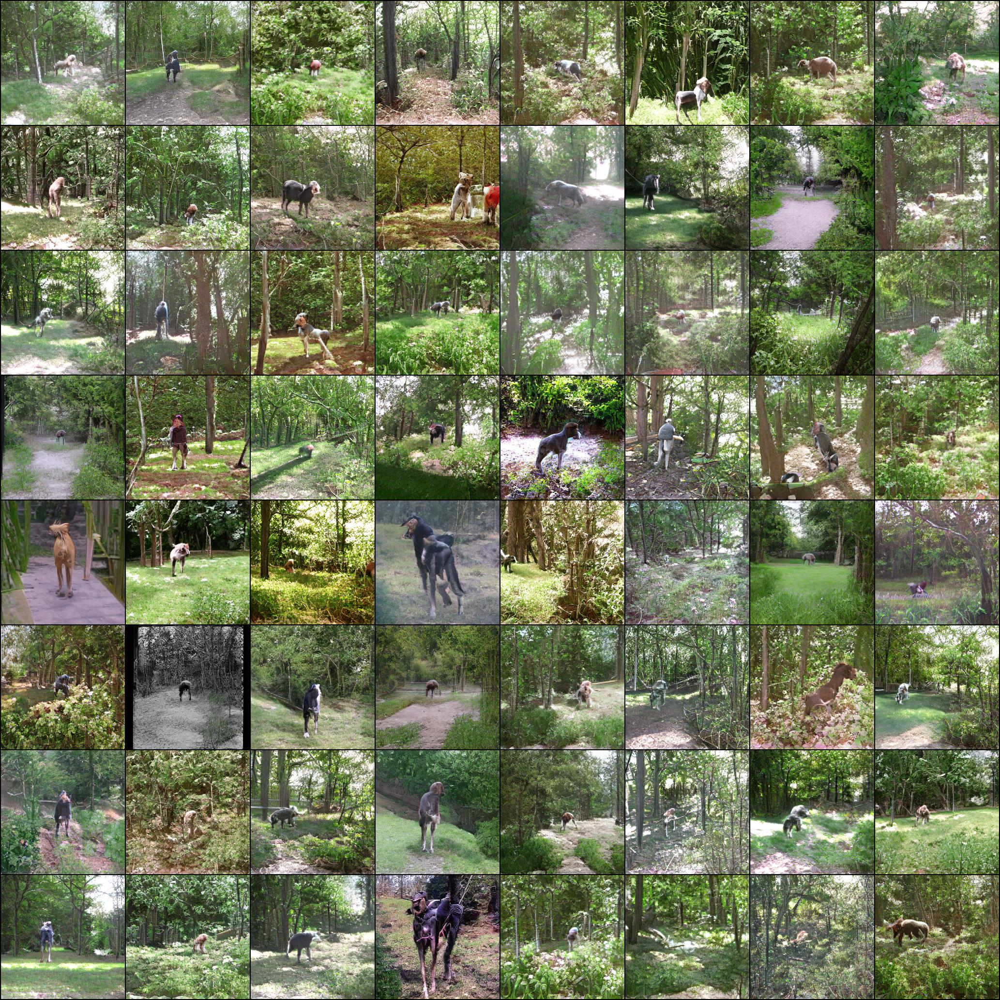

   51 |    3264 |  0.00000E+00 |  0.00000E+00 |      -0.3354 |      -0.3142
   52 |    3328 |  0.00000E+00 |  0.00000E+00 |      -0.3354 |      -0.3145
   53 |    3392 |  0.00000E+00 |  0.00000E+00 |      -0.3354 |      -0.3147
   54 |    3456 |  0.00000E+00 |  0.00000E+00 |      -0.3354 |      -0.3154
   55 |    3520 |  0.00000E+00 |  0.00000E+00 |      -0.3354 |      -0.3157
   56 |    3584 |  0.00000E+00 |  0.00000E+00 |      -0.3354 |      -0.3162
   57 |    3648 |  0.00000E+00 |  0.00000E+00 |      -0.3354 |      -0.3162
   58 |    3712 |  0.00000E+00 |  0.00000E+00 |      -0.3354 |      -0.3171
   59 |    3776 |  0.00000E+00 |  0.00000E+00 |      -0.3354 |      -0.3174
   60 |    3840 |  0.00000E+00 |  0.00000E+00 |      -0.3354 |       -0.318


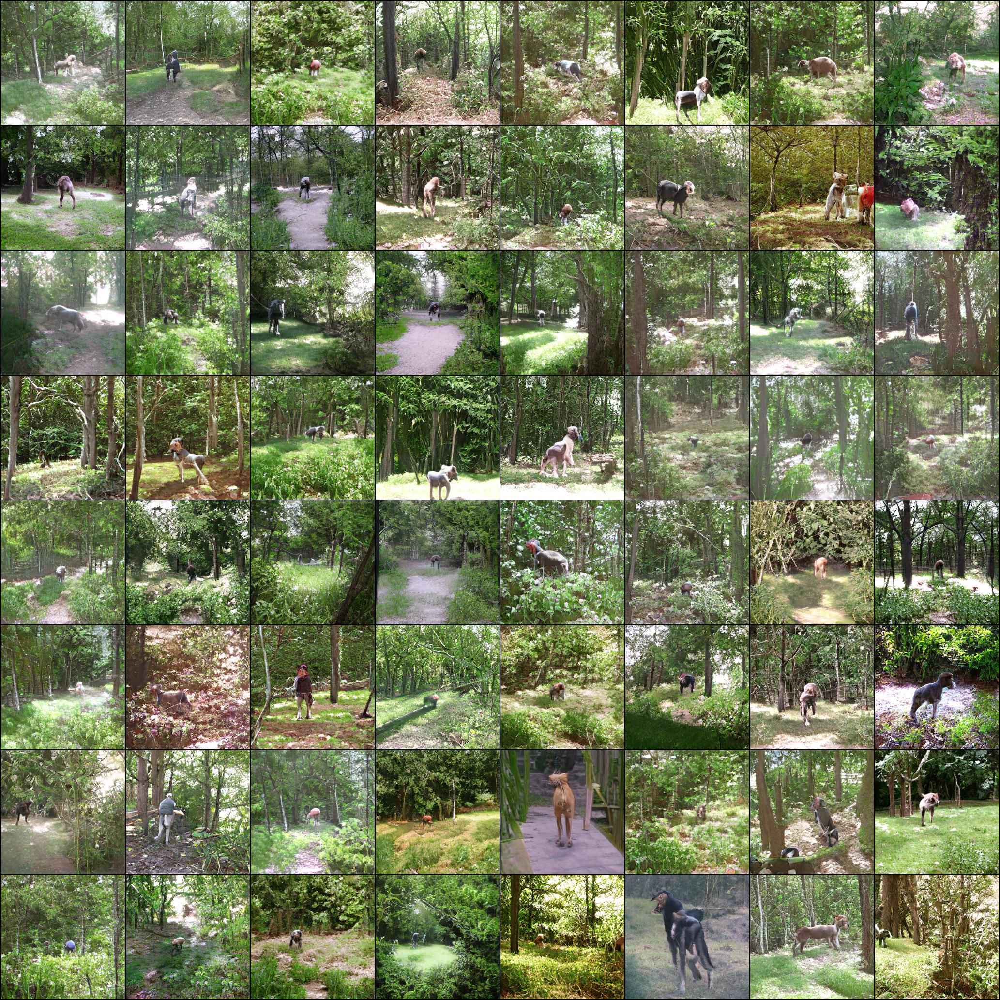

   61 |    3904 |  0.00000E+00 |  0.00000E+00 |      -0.3354 |       -0.318
   62 |    3968 |  0.00000E+00 |  0.00000E+00 |      -0.3354 |      -0.3184
   63 |    4032 |  0.00000E+00 |  0.00000E+00 |      -0.3354 |      -0.3188
   64 |    4096 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |        -0.32
   65 |    4160 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3206
   66 |    4224 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3208
   67 |    4288 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |       -0.321
   68 |    4352 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |       -0.321
   69 |    4416 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3213
   70 |    4480 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3213


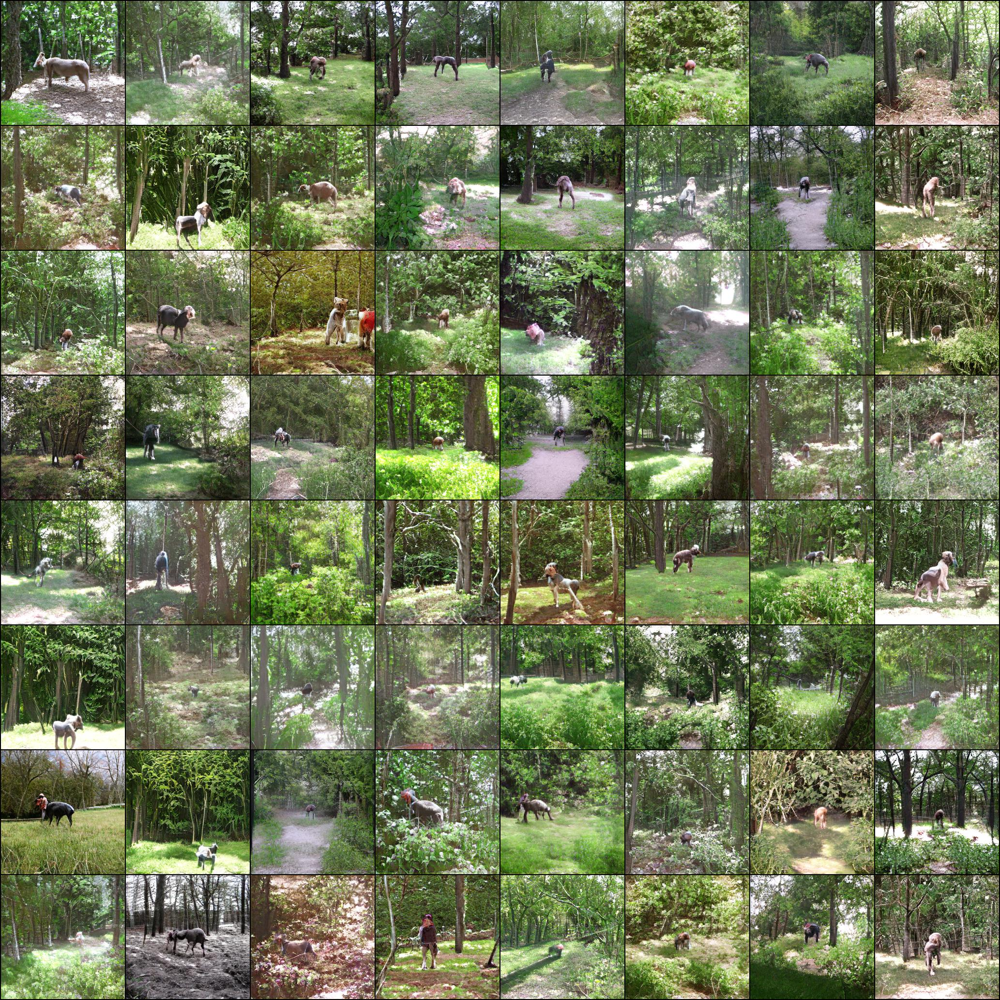

   71 |    4544 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3213
   72 |    4608 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |       -0.322
   73 |    4672 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3223
   74 |    4736 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3225
   75 |    4800 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3228
   76 |    4864 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3228
   77 |    4928 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3232
   78 |    4992 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3235
   79 |    5056 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3235
   80 |    5120 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3242


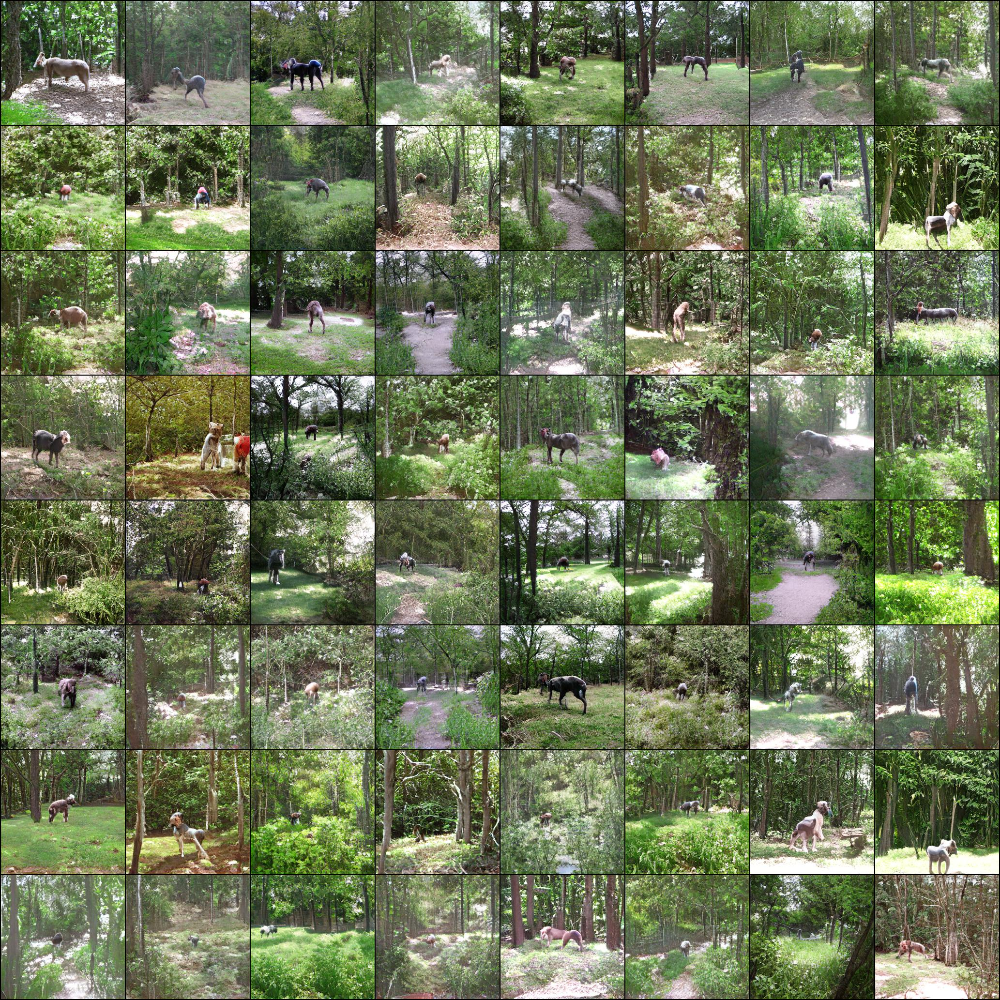

   81 |    5184 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3242
   82 |    5248 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3245
   83 |    5312 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3247
   84 |    5376 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |       -0.325
   85 |    5440 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |       -0.325
   86 |    5504 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3252
   87 |    5568 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3257
   88 |    5632 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |       -0.326
   89 |    5696 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3262
   90 |    5760 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3267


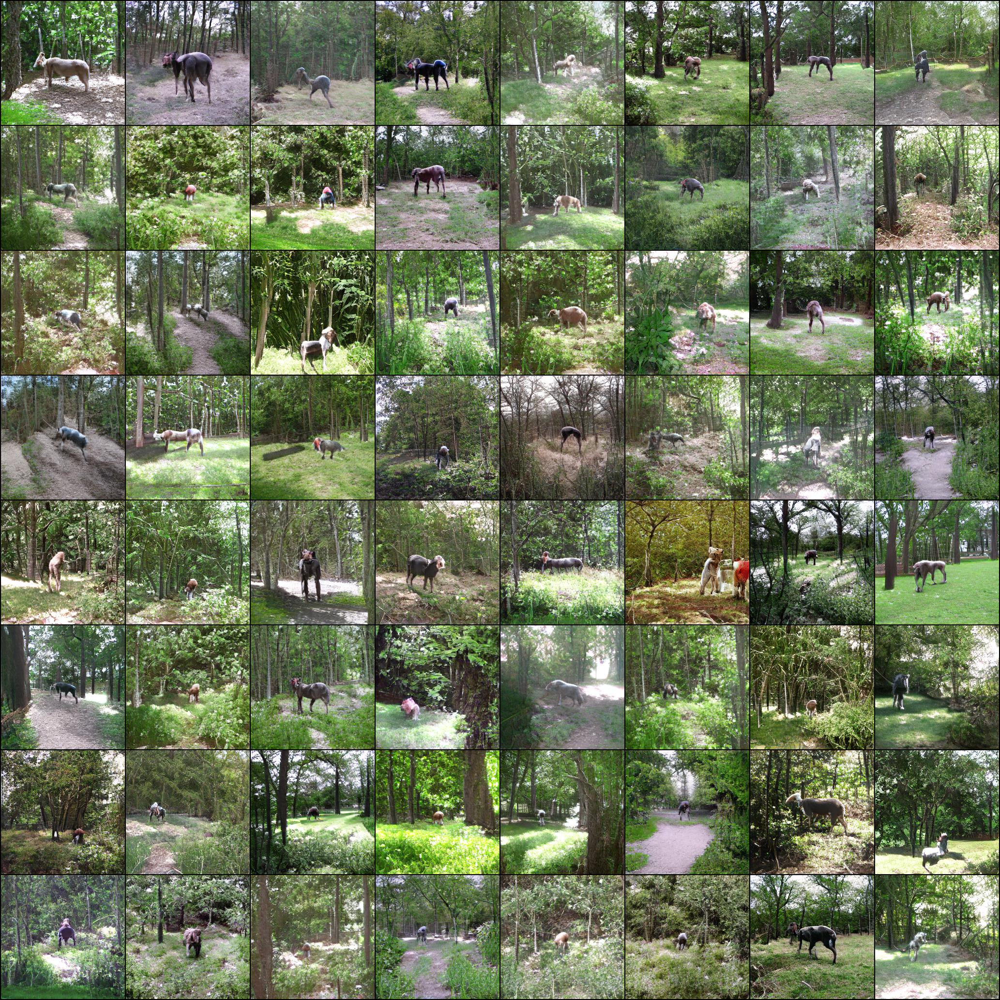

   91 |    5824 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |       -0.327
   92 |    5888 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |       -0.327
   93 |    5952 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3276
   94 |    6016 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3276
   95 |    6080 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |       -0.328
   96 |    6144 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3281
   97 |    6208 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3281
   98 |    6272 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3281
   99 |    6336 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3281
  100 |    6400 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3281


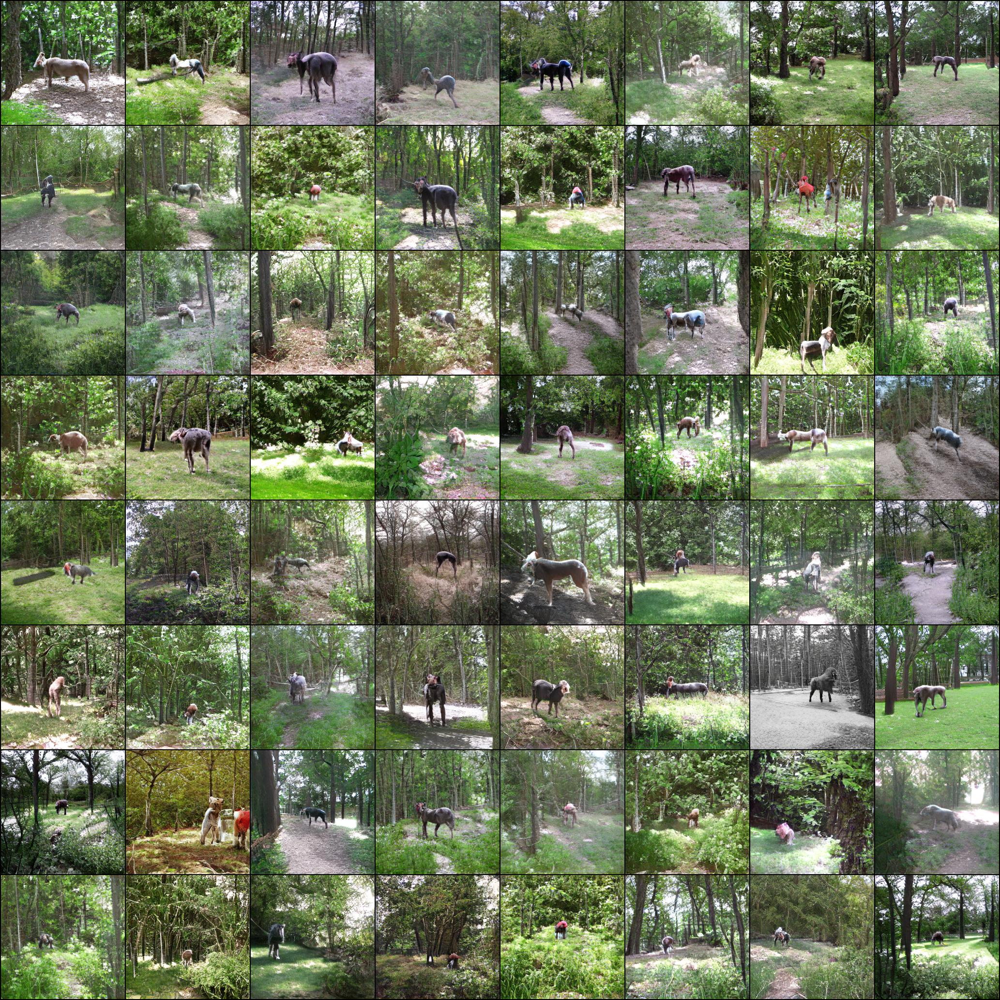

RESULT


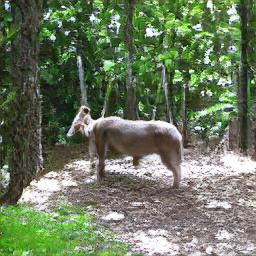

In [ ]:
#@title CLIP-GLaSS settings
import argparse
import os
import torch
import numpy as np
import pickle
from pymoo.optimize import minimize
from pymoo.algorithms.so_genetic_algorithm import GA
from pymoo.factory import get_algorithm, get_decision_making, get_decomposition
from pymoo.visualization.scatter import Scatter
import torchvision
from IPython.display import Image, display
import urllib.request


from config import get_config
from problem import GenerationProblem
from operators import get_operators

target = "a horse in the woods" #@param {type:"string"}
config = "DeepMindBigGAN256" #@param ["DeepMindBigGAN256", "DeepMindBigGAN512", "StyleGAN2_ffhq_d", "StyleGAN2_car_d", "StyleGAN2_church_d", "StyleGAN2_ffhq_nod", "StyleGAN2_car_nod", "StyleGAN2_church_nod", "GPT2"]
save_each = 10 #@param {type:"number"}
generations = 100 #@param {type:"number"}

if config == "GPT2":
  try:
    urllib.request.urlretrieve(target, "./target")
    target = "./target"
  except Exception as e:
    print(e)
    raise Exception("Target must be a vaild URL when using GPT2")
    

if "ffhq" in config:
  ! ./download-weights.sh StyleGAN2-ffhq
if "church" in config:
  ! ./download-weights.sh StyleGAN2-church
if "car" in config:
  ! ./download-weights.sh StyleGAN2-car
if config == "GPT2":
  ! ./download-weights.sh GPT2

config = argparse.Namespace(
    config=config,
    target=target,
    device="cuda",
    generations=generations,
    save_each=save_each,
    tmp_folder="./tmp"
)

vars(config).update(get_config(config.config))


iteration = 0
def save_callback(algorithm):
    global iteration
    global config

    iteration += 1
    if iteration % config.save_each == 0 or iteration == config.generations:
        if config.problem_args["n_obj"] == 1:
            sortedpop = sorted(algorithm.pop, key=lambda p: p.F)
            X = np.stack([p.X for p in sortedpop])  
        else:
            X = algorithm.pop.get("X")
        
        ls = config.latent(config)
        ls.set_from_population(X)

        with torch.no_grad():
            generated = algorithm.problem.generator.generate(ls, minibatch=config.batch_size)
            name = "genetic-it-%d.jpg" % (iteration) if iteration < config.generations else "genetic-it-final.jpg"

            if config.task == "txt2img":
                algorithm.problem.generator.save(generated, os.path.join(config.tmp_folder, name))
                display(Image(os.path.join(config.tmp_folder, name)))
            elif config.task == "img2txt":
                print("\n".join(generated))
        

problem = GenerationProblem(config)
operators = get_operators(config)

if not os.path.exists(config.tmp_folder): os.mkdir(config.tmp_folder)

algorithm = get_algorithm(
    config.algorithm,
    pop_size=config.pop_size,
    sampling=operators["sampling"],
    crossover=operators["crossover"],
    mutation=operators["mutation"],
    eliminate_duplicates=True,
    callback=save_callback,
    **(config.algorithm_args[config.algorithm] if "algorithm_args" in config and config.algorithm in config.algorithm_args else dict())
)

res = minimize(
    problem,
    algorithm,
    ("n_gen", config.generations),
    save_history=False,
    verbose=True,
)


pickle.dump(dict(
    X = res.X,
    F = res.F,
    G = res.G,
    CV = res.CV,
), open(os.path.join(config.tmp_folder, "genetic_result"), "wb"))


if config.problem_args["n_obj"] == 1:
    X = np.atleast_2d(res.X)
else:
    try:
        result = get_decision_making("pseudo-weights", [0, 1]).do(res.F)
    except:
        print("Warning: cant use pseudo-weights")
        result = get_decomposition("asf").do(res.F, [0, 1]).argmin()
    X = res.X[result]
    X = np.atleast_2d(X)

print("="*50)
print("RESULT")
print("="*50)


ls = config.latent(config)
ls.set_from_population(X)

with torch.no_grad():
    generated = problem.generator.generate(ls)

if config.task == "txt2img":
    problem.generator.save(generated, os.path.join(config.tmp_folder, "output.jpg"))
    display(Image(os.path.join(config.tmp_folder, "output.jpg")))
elif config.task == "img2txt":
    print(generated)

